In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
pip install rasterio

In [3]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cv2
import json
from PIL import Image
import os
import torch
import torch.nn as nn
import torch.nn.functional as F

In [4]:
dataset_path_rgn = "drive/MyDrive/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])

        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [5]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84
)

In [6]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.transforms import ToTensor

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    ToTensorV2()
])

test_transform = A.Compose([
    ToTensorV2()
])

val_transform = A.Compose([
    ToTensorV2()
])

def remove_outliers_img(image_array, lower_value = 1, upper_value = 99):
    stretched = np.zeros_like(image_array, dtype = np.float32)

    for i in range(image_array.shape[2]):
        band = image_array[:, :, i].astype(np.float32)
        lower_limit = np.percentile(band, lower_value)
        upper_limit = np.percentile(band, upper_value)

        if upper_limit - lower_limit < 1e-6:
            stretched[:, :, i] = band
        else:
            stretched[:, :, i] = np.clip((band - lower_limit) / (upper_limit - lower_limit) * 255.0, 0, 255)

    return stretched.astype(np.uint8)

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None, apply_remove_outliers = True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform
        self.apply_remove_outliers = apply_remove_outliers

    def __len__(self):
        return len(self.image_paths)

    def normalize(self, image, mask):
        image = (image - image.min()) / (image.max() - image.min() + 1e-8)
        mask = (mask > 0.5).float()
        return image, mask

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"), dtype = np.float32)
        mask = np.array(Image.open(mask_path).convert("L"), dtype = np.uint8)

        if self.apply_remove_outliers:
            image = remove_outliers_img(image)

        if self.transform:
            augmented = self.transform(image = image, mask = mask)
            image = augmented["image"]
            mask = augmented["mask"]
        else:
            image = torch.tensor(image).permute(2, 0, 1) / 255.0
            mask = torch.tensor(mask)

        mask = (mask > 0.5).float()
        mask = mask.unsqueeze(0).float()

        image, mask = self.normalize(image, mask)

        return image, mask, image_path, mask_path

In [7]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = True)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

In [8]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [9]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[0.4079, 0.3904, 0.4079,  ..., 0.1754, 0.1579, 0.1491],
         [0.4649, 0.4298, 0.3904,  ..., 0.1798, 0.1798, 0.1711],
         [0.4386, 0.4079, 0.3904,  ..., 0.2061, 0.1579, 0.1754],
         ...,
         [0.4474, 0.4518, 0.5132,  ..., 0.2061, 0.2237, 0.1930],
         [0.5307, 0.5351, 0.6009,  ..., 0.1930, 0.2149, 0.1930],
         [0.5921, 0.5965, 0.6009,  ..., 0.2105, 0.1667, 0.1535]],

        [[0.2719, 0.2632, 0.3114,  ..., 0.1754, 0.1667, 0.1579],
         [0.3070, 0.2719, 0.3070,  ..., 0.1667, 0.1754, 0.1974],
         [0.2588, 0.2368, 0.2807,  ..., 0.1711, 0.1360, 0.1535],
         ...,
         [0.4342, 0.4254, 0.4123,  ..., 0.2061, 0.2061, 0.1798],
         [0.5175, 0.5263, 0.5219,  ..., 0.2325, 0.2061, 0.2105],
         [0.4868, 0.5307, 0.5263,  ..., 0.1974, 0.1360, 0.1140]],

        [[0.2675, 0.2982, 0.2939,  ..., 0.1228, 0.1491, 0.1184],
         [0.2500, 0.2807, 0.2982,  ..., 0.1447, 0.1754, 0.0833],
         [0.2281, 0.2675, 0.2807,  ..., 0.1228, 0.1491, 0.

In [10]:
print(mask_train)
print(mask_train.shape)

tensor([[[0., 0., 0.,  ..., 1., 1., 1.],
         [0., 0., 0.,  ..., 1., 1., 1.],
         [0., 0., 0.,  ..., 1., 1., 1.],
         ...,
         [0., 0., 0.,  ..., 1., 1., 1.],
         [0., 0., 0.,  ..., 1., 1., 1.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [11]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[0.1529, 0.1216, 0.1176,  ..., 0.3804, 0.4588, 0.1725],
         [0.2392, 0.2118, 0.1922,  ..., 0.2941, 0.2745, 0.1333],
         [0.2745, 0.2549, 0.2314,  ..., 0.1059, 0.1412, 0.2353],
         ...,
         [0.7961, 0.8000, 0.8118,  ..., 0.2706, 0.2588, 0.0863],
         [0.7961, 0.8000, 0.8039,  ..., 0.0667, 0.0627, 0.1020],
         [0.7882, 0.7961, 0.8000,  ..., 0.0392, 0.0000, 0.0627]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3490, 0.4431, 0.1412],
         [0.2078, 0.1765, 0.1569,  ..., 0.2745, 0.2510, 0.1098],
         [0.2510, 0.2275, 0.2039,  ..., 0.0824, 0.1176, 0.2353],
         ...,
         [0.7765, 0.7843, 0.7922,  ..., 0.2667, 0.2549, 0.0706],
         [0.7765, 0.7843, 0.7882,  ..., 0.0510, 0.0392, 0.0824],
         [0.7725, 0.7765, 0.7843,  ..., 0.0196, 0.0000, 0.0392]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3961, 0.5020, 0.1922],
         [0.2078, 0.1765, 0.1569,  ..., 0.3137, 0.3059, 0.1569],
         [0.2353, 0.2157, 0.1882,  ..., 0.1216, 0.1686, 0.

In [12]:
print(mask_test)
print(mask_test.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [13]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[0.4314, 0.3490, 0.3098,  ..., 0.1608, 0.2431, 0.2510],
         [0.3333, 0.4000, 0.2275,  ..., 0.1490, 0.1686, 0.1333],
         [0.3490, 0.4980, 0.2980,  ..., 0.2157, 0.1922, 0.1490],
         ...,
         [0.2078, 0.2157, 0.2078,  ..., 0.3804, 0.4980, 0.3922],
         [0.1922, 0.2078, 0.2078,  ..., 0.5725, 0.5216, 0.4549],
         [0.1843, 0.2000, 0.2078,  ..., 0.3843, 0.5294, 0.5490]],

        [[0.4235, 0.3294, 0.2784,  ..., 0.1843, 0.2784, 0.2863],
         [0.3098, 0.3882, 0.1843,  ..., 0.1686, 0.1922, 0.1490],
         [0.3294, 0.4980, 0.2706,  ..., 0.2431, 0.2196, 0.1686],
         ...,
         [0.2275, 0.2353, 0.2275,  ..., 0.4118, 0.5059, 0.3882],
         [0.2118, 0.2275, 0.2275,  ..., 0.6353, 0.5333, 0.4549],
         [0.2000, 0.2196, 0.2275,  ..., 0.4235, 0.5412, 0.5647]],

        [[0.4078, 0.3098, 0.2431,  ..., 0.1882, 0.2863, 0.2941],
         [0.2941, 0.3725, 0.1451,  ..., 0.1725, 0.2000, 0.1529],
         [0.3098, 0.4863, 0.2510,  ..., 0.2510, 0.2235, 0.

In [14]:
print(mask_val)
print(mask_val.shape)

tensor([[[0., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 0., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
torch.Size([1, 256, 256])


In [15]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [19]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [20]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [21]:
for image, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [22]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        bce_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction = "none")
        pt = torch.exp(-bce_loss)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce_loss).mean()

        probs = torch.sigmoid(inputs)
        probs = probs.contiguous().view(probs.shape[0], -1)
        targets = targets.contiguous().view(targets.shape[0], -1)

        intersection = (probs * targets).sum(dim = 1)
        dice_score = (2.0 * intersection + smooth) / (probs.sum(dim = 1) + targets.sum(dim = 1) + smooth)
        dice_loss = 1 - dice_score.mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [23]:
def calc_iou(pred_mask, gt_mask, smooth = 1e-6):
    pred_mask = torch.sigmoid(pred_mask.detach())
    pred_mask = (pred_mask > 0.5).float()

    gt_mask = (gt_mask.detach() > 0).float()

    if pred_mask.dim() == 3:
        pred_mask = pred_mask.unsqueeze(1)
    if gt_mask.dim() == 3:
        gt_mask = gt_mask.unsqueeze(1)

    batch_size = pred_mask.shape[0]
    iou_list = []

    for i in range(batch_size):
        gt = gt_mask[i]
        pred = pred_mask[i]

        intersect = (pred * gt).sum()
        union = pred.sum() + gt.sum() - intersect

        if gt.sum() == 0:
            if pred.sum() == 0:
                iou = 1.0
            else:
                iou = 0.0
        else:
            iou = (intersect + smooth) / (union + smooth)

        iou_list.append(iou)

    return torch.tensor(iou_list).mean().item()

In [24]:
!pip install transformers datasets accelerate timm

In [25]:
from transformers import SegformerFeatureExtractor, SegformerForSemanticSegmentation

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b5-finetuned-ade-640-640",
    num_labels = 2,
    ignore_mismatched_sizes = True
).to(device)

for param in model.segformer.encoder.parameters():
    param.requires_grad = False

for param in model.segformer.encoder.block[3].parameters():
    param.requires_grad = True

for m in model.modules():
    if isinstance(m, nn.BatchNorm2d):
        for param in m.parameters():
            param.requires_grad = True

trainable_params = [p for p in model.parameters() if p.requires_grad]
print(f"Trainable parameters: {sum(p.numel() for p in trainable_params)}")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You sho

Trainable parameters: 12670466


In [26]:
!pip install optuna

In [27]:
import torch.optim as optim
from tqdm import tqdm
import warnings
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR
import optuna

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, device, scheduler_type, dice_weight, focal_weight):
    loss_func = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)

    optimizer = optim.AdamW([
        {"params": model.segformer.encoder.block[-1].parameters(), "lr": 0.0001},
        {"params": model.decode_head.parameters(), "lr": 0.0001}
    ])

    num_epoch = 25

    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    trigger = 0
    best_val_loss = float('inf')
    best_model = None

    for epoch in range(num_epoch):

        model.train()
        total_loss = 0
        total_iou = 0

        for images, masks, _, _ in tqdm(train_loader):
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(pixel_values = images)
            logits = outputs.logits

            logits = torch.nn.functional.interpolate(
                logits, size = masks.shape[2:], mode = "bilinear", align_corners = False
            )

            logits = logits[:, 1:2, :, :]
            loss = loss_func(logits, masks.float())
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(logits, masks)

        avg_loss = total_loss / len(train_loader)
        avg_iou = total_iou / len(train_loader)

        print(f"Epoch {epoch + 1}/{num_epoch}")
        print(f"Train Loss: {avg_loss}, Train Avg IoU: {avg_iou}")

        model.eval()
        val_loss = 0
        val_iou = 0

        with torch.no_grad():
            for val_images, val_masks, _, _ in tqdm(val_loader):
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                outputs = model(pixel_values=val_images)
                logits = outputs.logits
                logits = torch.nn.functional.interpolate(
                    logits, size = val_masks.shape[2:], mode = "bilinear", align_corners = False
                )
                logits = logits[:, 1:2, :, :]
                loss = loss_func(logits, val_masks.float())
                val_loss += loss.item()
                val_iou += calc_iou(logits, val_masks)

        val_avg_loss = val_loss / len(val_loader)
        val_avg_iou = val_iou / len(val_loader)

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()

        print(f"Val Loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1
        if trigger >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [28]:
import gc

fine_tune_model = None

def objective(trial):
    global fine_tune_model
    torch.cuda.empty_cache()
    gc.collect()

    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(1.0, 0.0), (0.7, 0.3), (0.5, 0.5), (0.3, 0.7), (0.1, 0.9), (0.0, 1.0)])

    model = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/segformer-b5-finetuned-ade-640-640",
        num_labels = 2,
        ignore_mismatched_sizes = True
    )

    for param in model.segformer.encoder.parameters():
        param.requires_grad = False

    for param in model.segformer.encoder.block[3].parameters():
        param.requires_grad = True

    for m in model.modules():
        if isinstance(m, nn.BatchNorm2d):
            for param in m.parameters():
                param.requires_grad = True

    def batchnorm_to_groupnorm(model, num_groups = 32):
        for name, module in list(model.named_children()):
            if isinstance(module, nn.BatchNorm2d):
                num_features = module.num_features
                valid_num_groups = min(num_groups, num_features)
                while num_features % valid_num_groups != 0 and valid_num_groups > 1:
                    valid_num_groups -= 1
                new_module = nn.GroupNorm(num_groups = valid_num_groups, num_channels = num_features)
                setattr(model, name, new_module)
            else:
                batchnorm_to_groupnorm(module, num_groups)
        return model

    model = batchnorm_to_groupnorm(model)
    model = model.to(device)

    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")

    best_model, val_loss = train_model(
        model = model,
        train_loader = train_loader,
        val_loader = val_loader,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_model = best_model

    return val_loss

In [29]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(1.0, 0.0)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 3)

[I 2025-11-21 07:02:53,262] A new study created in memory with name: no-name-991740cc-a9c9-4cfd-a793-f314446b960e
Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 0: scheduler = cosine, dice weight = 1.0, focal weight = 0.0



100%|██████████| 144/144 [00:33<00:00,  4.33it/s]


Epoch 1/25
Train Loss: 0.36242009947697323, Train Avg IoU: 0.5329278826247901


100%|██████████| 18/18 [00:03<00:00,  5.70it/s]


Val Loss: 0.27982443902227616, Val Avg IoU: 0.6338619159327613



100%|██████████| 144/144 [00:19<00:00,  7.22it/s]


Epoch 2/25
Train Loss: 0.2511235512793064, Train Avg IoU: 0.6775966862442065


100%|██████████| 18/18 [00:01<00:00, 12.82it/s]


Val Loss: 0.21582658423317802, Val Avg IoU: 0.7027377527621057



100%|██████████| 144/144 [00:16<00:00,  8.82it/s]


Epoch 3/25
Train Loss: 0.20037252952655157, Train Avg IoU: 0.7226410574464049


100%|██████████| 18/18 [00:01<00:00, 12.37it/s]


Val Loss: 0.19120862086613974, Val Avg IoU: 0.7302645502818955



100%|██████████| 144/144 [00:15<00:00,  9.33it/s]


Epoch 4/25
Train Loss: 0.1785301570263174, Train Avg IoU: 0.7436265600845218


100%|██████████| 18/18 [00:01<00:00, 12.50it/s]


Val Loss: 0.1792359385225508, Val Avg IoU: 0.7382805032862557



100%|██████████| 144/144 [00:15<00:00,  9.33it/s]


Epoch 5/25
Train Loss: 0.16708842375212246, Train Avg IoU: 0.7543634084156818


100%|██████████| 18/18 [00:01<00:00, 12.98it/s]


Val Loss: 0.16790168815188938, Val Avg IoU: 0.7481676853365369



100%|██████████| 144/144 [00:15<00:00,  9.12it/s]


Epoch 6/25
Train Loss: 0.15470311335391468, Train Avg IoU: 0.7661428172141314


100%|██████████| 18/18 [00:01<00:00,  9.15it/s]


Val Loss: 0.16200331184599134, Val Avg IoU: 0.7526427590184741



100%|██████████| 144/144 [00:15<00:00,  9.28it/s]


Epoch 7/25
Train Loss: 0.15307995014720494, Train Avg IoU: 0.7653905325051811


100%|██████████| 18/18 [00:01<00:00, 12.74it/s]


Val Loss: 0.15837436583307055, Val Avg IoU: 0.7522770315408707



100%|██████████| 144/144 [00:23<00:00,  6.09it/s]


Epoch 8/25
Train Loss: 0.14649831048316425, Train Avg IoU: 0.7728185188025236


100%|██████████| 18/18 [00:02<00:00,  6.38it/s]


Val Loss: 0.1535065604580773, Val Avg IoU: 0.7613115989499621



100%|██████████| 144/144 [00:15<00:00,  9.32it/s]


Epoch 9/25
Train Loss: 0.14985540592008167, Train Avg IoU: 0.7682251009779671


100%|██████████| 18/18 [00:01<00:00, 13.11it/s]


Val Loss: 0.15022333131896126, Val Avg IoU: 0.7662280549605688



100%|██████████| 144/144 [00:15<00:00,  9.36it/s]


Epoch 10/25
Train Loss: 0.14371718880203035, Train Avg IoU: 0.7761205211281776


100%|██████████| 18/18 [00:01<00:00, 12.21it/s]


Val Loss: 0.1513189905219608, Val Avg IoU: 0.7646794699960284



100%|██████████| 144/144 [00:16<00:00,  8.96it/s]


Epoch 11/25
Train Loss: 0.14099703315231535, Train Avg IoU: 0.7790564306908183


100%|██████████| 18/18 [00:01<00:00, 12.87it/s]


Val Loss: 0.15291022260983786, Val Avg IoU: 0.7598571678002676



100%|██████████| 144/144 [00:15<00:00,  9.40it/s]


Epoch 12/25
Train Loss: 0.14042443533738455, Train Avg IoU: 0.7800288599812322


100%|██████████| 18/18 [00:01<00:00, 12.98it/s]


Val Loss: 0.15285515122943455, Val Avg IoU: 0.7624262256754769



100%|██████████| 144/144 [00:15<00:00,  9.39it/s]


Epoch 13/25
Train Loss: 0.135778635326359, Train Avg IoU: 0.7848292336695724


100%|██████████| 18/18 [00:01<00:00, 12.84it/s]


Val Loss: 0.15349200699064466, Val Avg IoU: 0.7599688933955299



100%|██████████| 144/144 [00:15<00:00,  9.23it/s]


Epoch 14/25
Train Loss: 0.13357712949315706, Train Avg IoU: 0.7869408869494995


100%|██████████| 18/18 [00:01<00:00,  9.02it/s]


Val Loss: 0.15467633472548592, Val Avg IoU: 0.7562615308496687



100%|██████████| 144/144 [00:15<00:00,  9.30it/s]


Epoch 15/25
Train Loss: 0.13079893050922287, Train Avg IoU: 0.79109008403288


100%|██████████| 18/18 [00:01<00:00, 12.13it/s]


Val Loss: 0.14619849456681144, Val Avg IoU: 0.766289954384168



100%|██████████| 144/144 [00:15<00:00,  9.28it/s]


Epoch 16/25
Train Loss: 0.12998545625143582, Train Avg IoU: 0.7916667097144656


100%|██████████| 18/18 [00:01<00:00, 12.68it/s]


Val Loss: 0.15017344885402256, Val Avg IoU: 0.7620687567525439



100%|██████████| 144/144 [00:15<00:00,  9.29it/s]


Epoch 17/25
Train Loss: 0.13364964144097435, Train Avg IoU: 0.7877745063354572


100%|██████████| 18/18 [00:01<00:00,  9.17it/s]


Val Loss: 0.14532387918896145, Val Avg IoU: 0.7686305509673225



100%|██████████| 144/144 [00:15<00:00,  9.00it/s]


Epoch 18/25
Train Loss: 0.1317816430495845, Train Avg IoU: 0.7896268502291706


100%|██████████| 18/18 [00:01<00:00, 12.66it/s]


Val Loss: 0.15540237559212577, Val Avg IoU: 0.7551783621311188



100%|██████████| 144/144 [00:15<00:00,  9.31it/s]


Epoch 19/25
Train Loss: 0.12939530735214552, Train Avg IoU: 0.7924167979508638


100%|██████████| 18/18 [00:01<00:00, 12.69it/s]


Val Loss: 0.15291375584072536, Val Avg IoU: 0.7570731457736757



100%|██████████| 144/144 [00:15<00:00,  9.25it/s]


Epoch 20/25
Train Loss: 0.12788041970796055, Train Avg IoU: 0.7944321951104535


100%|██████████| 18/18 [00:01<00:00, 11.50it/s]


Val Loss: 0.15042657984627616, Val Avg IoU: 0.76050546599759



100%|██████████| 144/144 [00:16<00:00,  8.88it/s]


Epoch 21/25
Train Loss: 0.12759127136733797, Train Avg IoU: 0.795788434230619


100%|██████████| 18/18 [00:01<00:00, 12.44it/s]


Val Loss: 0.15090318520863852, Val Avg IoU: 0.760109500752555



100%|██████████| 144/144 [00:15<00:00,  9.38it/s]


Epoch 22/25
Train Loss: 0.12801655464702183, Train Avg IoU: 0.7944546813766161


100%|██████████| 18/18 [00:01<00:00, 12.61it/s]


Val Loss: 0.15217995974752638, Val Avg IoU: 0.758615200718244



100%|██████████| 144/144 [00:15<00:00,  9.28it/s]


Epoch 23/25
Train Loss: 0.13026442295975155, Train Avg IoU: 0.7917860220703814


100%|██████████| 18/18 [00:01<00:00, 12.75it/s]


Val Loss: 0.15054423279232448, Val Avg IoU: 0.7605142311917411



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 24/25
Train Loss: 0.1255839384264416, Train Avg IoU: 0.7979234101043807


100%|██████████| 18/18 [00:01<00:00,  9.57it/s]


Val Loss: 0.15075628625022042, Val Avg IoU: 0.7601836737659242



100%|██████████| 144/144 [00:15<00:00,  9.35it/s]


Epoch 25/25
Train Loss: 0.1284020911488268, Train Avg IoU: 0.794659561995003


100%|██████████| 18/18 [00:01<00:00, 12.50it/s]
[I 2025-11-21 07:10:38,371] Trial 0 finished with value: 0.14532387918896145 and parameters: {'scheduler': 'cosine', 'loss_weight': (1.0, 0.0)}. Best is trial 0 with value: 0.14532387918896145.


Val Loss: 0.15084326267242432, Val Avg IoU: 0.7600699365139008



Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 1: scheduler = reducelr, dice weight = 1.0, focal weight = 0.0



100%|██████████| 144/144 [00:15<00:00,  9.41it/s]


Epoch 1/25
Train Loss: 0.3498801522784763, Train Avg IoU: 0.553355226867597


100%|██████████| 18/18 [00:01<00:00, 13.10it/s]


Val Loss: 0.27216695414649117, Val Avg IoU: 0.6504581603738997



100%|██████████| 144/144 [00:16<00:00,  8.92it/s]


Epoch 2/25
Train Loss: 0.23437070846557617, Train Avg IoU: 0.6967629523626075


100%|██████████| 18/18 [00:01<00:00, 11.79it/s]


Val Loss: 0.2018564542134603, Val Avg IoU: 0.7182367245356241



100%|██████████| 144/144 [00:15<00:00,  9.38it/s]


Epoch 3/25
Train Loss: 0.19562971633341578, Train Avg IoU: 0.7382225590150079


100%|██████████| 18/18 [00:01<00:00, 12.85it/s]


Val Loss: 0.1947978569401635, Val Avg IoU: 0.7171921390626166



100%|██████████| 144/144 [00:15<00:00,  9.45it/s]


Epoch 4/25
Train Loss: 0.17337153603633246, Train Avg IoU: 0.7550213891598914


100%|██████████| 18/18 [00:01<00:00, 12.67it/s]


Val Loss: 0.19268986913892958, Val Avg IoU: 0.7210120997495122



100%|██████████| 144/144 [00:15<00:00,  9.32it/s]


Epoch 5/25
Train Loss: 0.1613779581255383, Train Avg IoU: 0.761265727587872


100%|██████████| 18/18 [00:01<00:00,  9.20it/s]


Val Loss: 0.1682811677455902, Val Avg IoU: 0.7465151995420456



100%|██████████| 144/144 [00:15<00:00,  9.24it/s]


Epoch 6/25
Train Loss: 0.16002951645188862, Train Avg IoU: 0.7584943197046717


100%|██████████| 18/18 [00:01<00:00, 12.38it/s]


Val Loss: 0.15978120432959664, Val Avg IoU: 0.7558612806929482



100%|██████████| 144/144 [00:15<00:00,  9.46it/s]


Epoch 7/25
Train Loss: 0.14947980187005466, Train Avg IoU: 0.7707466611431705


100%|██████████| 18/18 [00:01<00:00, 12.95it/s]


Val Loss: 0.15465343329641554, Val Avg IoU: 0.7624147401915656



100%|██████████| 144/144 [00:15<00:00,  9.44it/s]


Epoch 8/25
Train Loss: 0.16133075331648192, Train Avg IoU: 0.7565146719829904


100%|██████████| 18/18 [00:01<00:00, 12.02it/s]


Val Loss: 0.15102531181441414, Val Avg IoU: 0.767196892036332



100%|██████████| 144/144 [00:15<00:00,  9.08it/s]


Epoch 9/25
Train Loss: 0.1474367214573754, Train Avg IoU: 0.772905627058612


100%|██████████| 18/18 [00:01<00:00, 11.90it/s]


Val Loss: 0.15031378136740792, Val Avg IoU: 0.7654433300097784



100%|██████████| 144/144 [00:15<00:00,  9.37it/s]


Epoch 10/25
Train Loss: 0.13911175438099438, Train Avg IoU: 0.7795992826835977


100%|██████████| 18/18 [00:01<00:00, 12.73it/s]


Val Loss: 0.14939186639255947, Val Avg IoU: 0.7645798590448167



100%|██████████| 144/144 [00:15<00:00,  9.44it/s]


Epoch 11/25
Train Loss: 0.14075184489289919, Train Avg IoU: 0.7790324528598123


100%|██████████| 18/18 [00:01<00:00, 12.90it/s]


Val Loss: 0.14781116445859274, Val Avg IoU: 0.7668042083581289



100%|██████████| 144/144 [00:15<00:00,  9.28it/s]


Epoch 12/25
Train Loss: 0.1367865771883064, Train Avg IoU: 0.7827323766218292


100%|██████████| 18/18 [00:02<00:00,  8.98it/s]


Val Loss: 0.14366897609498766, Val Avg IoU: 0.7731046858761046



100%|██████████| 144/144 [00:15<00:00,  9.33it/s]


Epoch 13/25
Train Loss: 0.13800094607803556, Train Avg IoU: 0.7815434796114763


100%|██████████| 18/18 [00:01<00:00, 12.72it/s]


Val Loss: 0.1522995928923289, Val Avg IoU: 0.7601751734813055



100%|██████████| 144/144 [00:15<00:00,  9.38it/s]


Epoch 14/25
Train Loss: 0.13423484853572315, Train Avg IoU: 0.7852069592724243


100%|██████████| 18/18 [00:01<00:00, 12.80it/s]


Val Loss: 0.14595943027072483, Val Avg IoU: 0.7679663366741605



100%|██████████| 144/144 [00:15<00:00,  9.42it/s]


Epoch 15/25
Train Loss: 0.12956706061959267, Train Avg IoU: 0.7909479443397787


100%|██████████| 18/18 [00:01<00:00, 10.97it/s]


Val Loss: 0.1464514566792382, Val Avg IoU: 0.7665107895930608



100%|██████████| 144/144 [00:16<00:00,  8.87it/s]


Epoch 16/25
Train Loss: 0.12840045657422808, Train Avg IoU: 0.7926785196695063


100%|██████████| 18/18 [00:01<00:00, 12.73it/s]


Val Loss: 0.15866662396325004, Val Avg IoU: 0.7505004538430108



100%|██████████| 144/144 [00:15<00:00,  9.38it/s]


Epoch 17/25
Train Loss: 0.1273684021499422, Train Avg IoU: 0.7932066135108471


100%|██████████| 18/18 [00:01<00:00, 12.76it/s]


Val Loss: 0.1512484716044532, Val Avg IoU: 0.75973066356447



100%|██████████| 144/144 [00:15<00:00,  9.46it/s]


Epoch 18/25
Train Loss: 0.12499997723433706, Train Avg IoU: 0.7963364349885119


100%|██████████| 18/18 [00:01<00:00, 12.67it/s]


Val Loss: 0.1563427878750695, Val Avg IoU: 0.7533319377236896



100%|██████████| 144/144 [00:15<00:00,  9.11it/s]


Epoch 19/25
Train Loss: 0.12830988897217643, Train Avg IoU: 0.7929595575357477


100%|██████████| 18/18 [00:01<00:00,  9.75it/s]


Val Loss: 0.14189796646436056, Val Avg IoU: 0.7707730796602037



100%|██████████| 144/144 [00:15<00:00,  9.45it/s]


Epoch 20/25
Train Loss: 0.12721511845787367, Train Avg IoU: 0.7940217424184084


100%|██████████| 18/18 [00:01<00:00, 12.72it/s]


Val Loss: 0.14510498444239298, Val Avg IoU: 0.7662691391176648



100%|██████████| 144/144 [00:15<00:00,  9.38it/s]


Epoch 21/25
Train Loss: 0.12693559295601314, Train Avg IoU: 0.7937104269448254


100%|██████████| 18/18 [00:01<00:00, 12.40it/s]


Val Loss: 0.1427587999237908, Val Avg IoU: 0.7690920763545566



100%|██████████| 144/144 [00:15<00:00,  9.50it/s]


Epoch 22/25
Train Loss: 0.12535279409752953, Train Avg IoU: 0.7958631863196691


100%|██████████| 18/18 [00:01<00:00,  9.71it/s]


Val Loss: 0.14262178540229797, Val Avg IoU: 0.7691226601600647



100%|██████████| 144/144 [00:15<00:00,  9.12it/s]


Epoch 23/25
Train Loss: 0.12588010107477507, Train Avg IoU: 0.7945608453204235


100%|██████████| 18/18 [00:01<00:00, 12.63it/s]


Val Loss: 0.1405859755145179, Val Avg IoU: 0.7714103543096118



100%|██████████| 144/144 [00:15<00:00,  9.40it/s]


Epoch 24/25
Train Loss: 0.12178691517975596, Train Avg IoU: 0.8006420433521271


100%|██████████| 18/18 [00:01<00:00, 12.92it/s]


Val Loss: 0.13884289728270638, Val Avg IoU: 0.7731226732333502



100%|██████████| 144/144 [00:15<00:00,  9.30it/s]


Epoch 25/25
Train Loss: 0.12122939568426874, Train Avg IoU: 0.8016968982087241


100%|██████████| 18/18 [00:01<00:00, 13.02it/s]
[I 2025-11-21 07:17:45,408] Trial 1 finished with value: 0.13884289728270638 and parameters: {'scheduler': 'reducelr', 'loss_weight': (1.0, 0.0)}. Best is trial 1 with value: 0.13884289728270638.


Val Loss: 0.14084263973765904, Val Avg IoU: 0.7704733841949039



Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b5-finetuned-ade-640-640 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([150, 768, 1, 1]) in the checkpoint and torch.Size([2, 768, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Trial 2: scheduler = steplr, dice weight = 1.0, focal weight = 0.0



100%|██████████| 144/144 [00:15<00:00,  9.12it/s]


Epoch 1/25
Train Loss: 0.35720619186758995, Train Avg IoU: 0.5497334309232732


100%|██████████| 18/18 [00:01<00:00, 12.71it/s]


Val Loss: 0.2923405037985908, Val Avg IoU: 0.6286703269514773



100%|██████████| 144/144 [00:15<00:00,  9.32it/s]


Epoch 2/25
Train Loss: 0.23703856476479107, Train Avg IoU: 0.6876309141775386


100%|██████████| 18/18 [00:01<00:00, 12.75it/s]


Val Loss: 0.22201758291986254, Val Avg IoU: 0.6936088783873452



100%|██████████| 144/144 [00:15<00:00,  9.38it/s]


Epoch 3/25
Train Loss: 0.20275122879279983, Train Avg IoU: 0.7236353625129495


100%|██████████| 18/18 [00:01<00:00, 11.64it/s]


Val Loss: 0.19422450330522326, Val Avg IoU: 0.7224805835220549



100%|██████████| 144/144 [00:16<00:00,  8.97it/s]


Epoch 4/25
Train Loss: 0.17540193266338772, Train Avg IoU: 0.7436063235832585


100%|██████████| 18/18 [00:01<00:00, 12.38it/s]


Val Loss: 0.17997952964570788, Val Avg IoU: 0.735015708539221



100%|██████████| 144/144 [00:15<00:00,  9.38it/s]


Epoch 5/25
Train Loss: 0.16980947016013992, Train Avg IoU: 0.7502779254896773


100%|██████████| 18/18 [00:01<00:00, 12.85it/s]


Val Loss: 0.16733872890472412, Val Avg IoU: 0.7444434646103117



100%|██████████| 144/144 [00:15<00:00,  9.35it/s]


Epoch 6/25
Train Loss: 0.15453174130784142, Train Avg IoU: 0.7656447858446174


100%|██████████| 18/18 [00:01<00:00, 12.56it/s]


Val Loss: 0.16553691029548645, Val Avg IoU: 0.7484051651424832



100%|██████████| 144/144 [00:15<00:00,  9.13it/s]


Epoch 7/25
Train Loss: 0.15696262195706367, Train Avg IoU: 0.7618222768540811


100%|██████████| 18/18 [00:01<00:00,  9.55it/s]


Val Loss: 0.16149849030706617, Val Avg IoU: 0.7540987216764026



100%|██████████| 144/144 [00:15<00:00,  9.37it/s]


Epoch 8/25
Train Loss: 0.1498516115049521, Train Avg IoU: 0.7702220032612482


100%|██████████| 18/18 [00:01<00:00, 12.58it/s]


Val Loss: 0.16629646884070504, Val Avg IoU: 0.7490950442022748



100%|██████████| 144/144 [00:15<00:00,  9.33it/s]


Epoch 9/25
Train Loss: 0.14715169908271897, Train Avg IoU: 0.7726511686212487


100%|██████████| 18/18 [00:01<00:00, 12.53it/s]


Val Loss: 0.15735477209091187, Val Avg IoU: 0.7588054868910048



100%|██████████| 144/144 [00:15<00:00,  9.33it/s]


Epoch 10/25
Train Loss: 0.14704279601573944, Train Avg IoU: 0.7725353371351957


100%|██████████| 18/18 [00:01<00:00,  9.24it/s]


Val Loss: 0.15509209367964003, Val Avg IoU: 0.7603877120547824



100%|██████████| 144/144 [00:15<00:00,  9.15it/s]


Epoch 11/25
Train Loss: 0.14626818812555736, Train Avg IoU: 0.7733069718297985


100%|██████████| 18/18 [00:01<00:00, 12.65it/s]


Val Loss: 0.15461374653710258, Val Avg IoU: 0.7613637414243486



100%|██████████| 144/144 [00:15<00:00,  9.37it/s]


Epoch 12/25
Train Loss: 0.14254476005832353, Train Avg IoU: 0.7771156306068102


100%|██████████| 18/18 [00:01<00:00, 12.87it/s]


Val Loss: 0.1568121678299374, Val Avg IoU: 0.7572001781728532



100%|██████████| 144/144 [00:15<00:00,  9.30it/s]


Epoch 13/25
Train Loss: 0.1436880048778322, Train Avg IoU: 0.777775744183196


100%|██████████| 18/18 [00:01<00:00, 11.32it/s]


Val Loss: 0.15389751725726658, Val Avg IoU: 0.7615889857212702



100%|██████████| 144/144 [00:16<00:00,  8.95it/s]


Epoch 14/25
Train Loss: 0.13675203836626476, Train Avg IoU: 0.784861178861724


100%|██████████| 18/18 [00:01<00:00, 12.72it/s]


Val Loss: 0.15807640552520752, Val Avg IoU: 0.7540722721152835



100%|██████████| 144/144 [00:15<00:00,  9.29it/s]


Epoch 15/25
Train Loss: 0.13670226600435045, Train Avg IoU: 0.7853130901025401


100%|██████████| 18/18 [00:01<00:00, 12.42it/s]


Val Loss: 0.15744425853093466, Val Avg IoU: 0.7544979320632087



100%|██████████| 144/144 [00:15<00:00,  9.27it/s]


Epoch 16/25
Train Loss: 0.13823517908652624, Train Avg IoU: 0.7831373049153222


100%|██████████| 18/18 [00:01<00:00, 12.63it/s]


Val Loss: 0.1560685932636261, Val Avg IoU: 0.7557913859685262



100%|██████████| 144/144 [00:15<00:00,  9.07it/s]


Epoch 17/25
Train Loss: 0.13773765539129576, Train Avg IoU: 0.7830081938041581


100%|██████████| 18/18 [00:01<00:00,  9.35it/s]


Val Loss: 0.15528448753886753, Val Avg IoU: 0.7567421247561773



100%|██████████| 144/144 [00:15<00:00,  9.31it/s]


Epoch 18/25
Train Loss: 0.13745880789226955, Train Avg IoU: 0.7831522209776772


100%|██████████| 18/18 [00:01<00:00, 12.42it/s]


Val Loss: 0.1567871736155616, Val Avg IoU: 0.7543080747127533



100%|██████████| 144/144 [00:15<00:00,  9.27it/s]


Epoch 19/25
Train Loss: 0.13785620944367516, Train Avg IoU: 0.7831866737041209


100%|██████████| 18/18 [00:01<00:00, 12.52it/s]


Val Loss: 0.155763930744595, Val Avg IoU: 0.755958616733551



100%|██████████| 144/144 [00:15<00:00,  9.36it/s]


Epoch 20/25
Train Loss: 0.13580628401703304, Train Avg IoU: 0.7850060986561908


100%|██████████| 18/18 [00:02<00:00,  8.72it/s]


Val Loss: 0.15678617027070788, Val Avg IoU: 0.7553528282377455



100%|██████████| 144/144 [00:15<00:00,  9.10it/s]


Epoch 21/25
Train Loss: 0.13559764044152367, Train Avg IoU: 0.7859591369827589


100%|██████████| 18/18 [00:01<00:00, 12.71it/s]


Val Loss: 0.15696653061442906, Val Avg IoU: 0.7543755835956998



100%|██████████| 144/144 [00:15<00:00,  9.35it/s]


Epoch 22/25
Train Loss: 0.13676810016234717, Train Avg IoU: 0.7840862719135152


100%|██████████| 18/18 [00:01<00:00, 12.28it/s]


Val Loss: 0.1578538351588779, Val Avg IoU: 0.7533122118976381



100%|██████████| 144/144 [00:15<00:00,  9.27it/s]


Epoch 23/25
Train Loss: 0.13897458049986097, Train Avg IoU: 0.7813981345130337


100%|██████████| 18/18 [00:01<00:00, 12.10it/s]
[I 2025-11-21 07:24:21,749] Trial 2 finished with value: 0.15389751725726658 and parameters: {'scheduler': 'steplr', 'loss_weight': (1.0, 0.0)}. Best is trial 1 with value: 0.13884289728270638.


Val Loss: 0.15481620364718968, Val Avg IoU: 0.7572090824445089

Early stopping at epoch 23


In [30]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'reducelr', 'loss_weight': (1.0, 0.0)}
Best val loss: 0.13884289728270638


In [31]:
fine_tune_model.eval()

SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (encoder): SegformerEncoder(
      (patch_embeddings): ModuleList(
        (0): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (1): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        )
        (2): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(128, 320, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
        )
        (3): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(320, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)

In [32]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        if intersection == 0:
            return 1.0
        else:
            return 0.0
    else:
        iou = intersection / union
        return iou

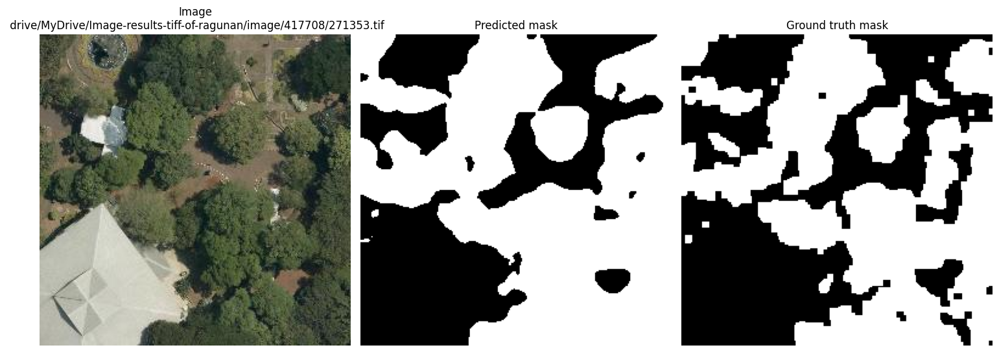

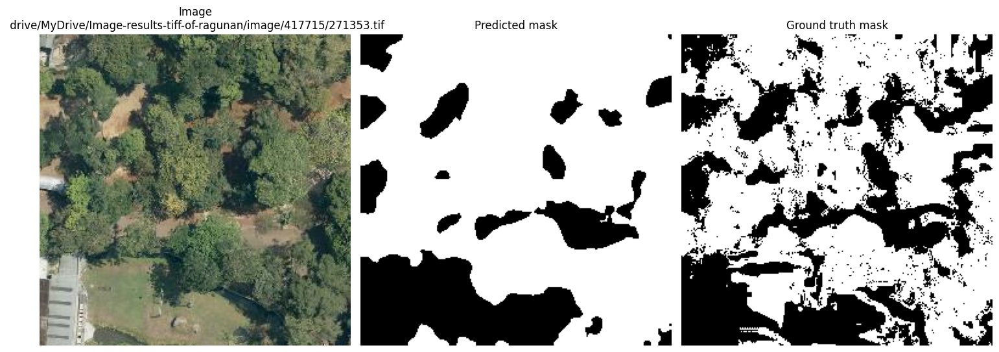

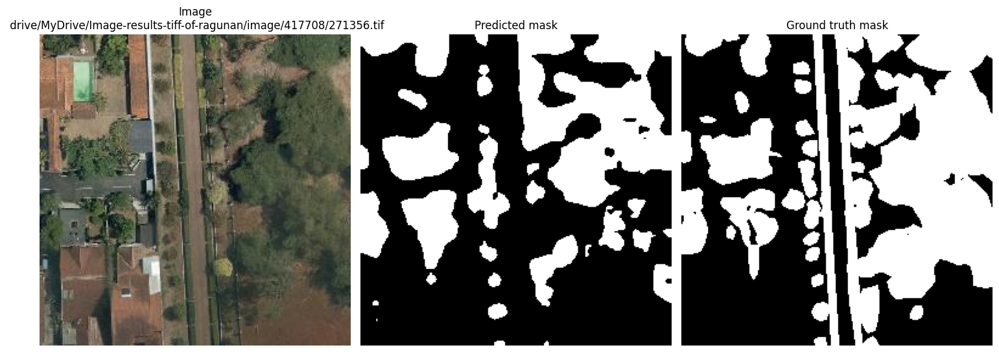

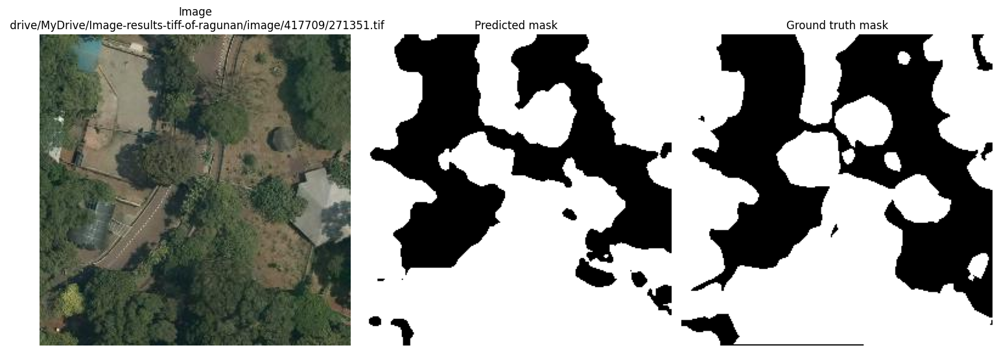

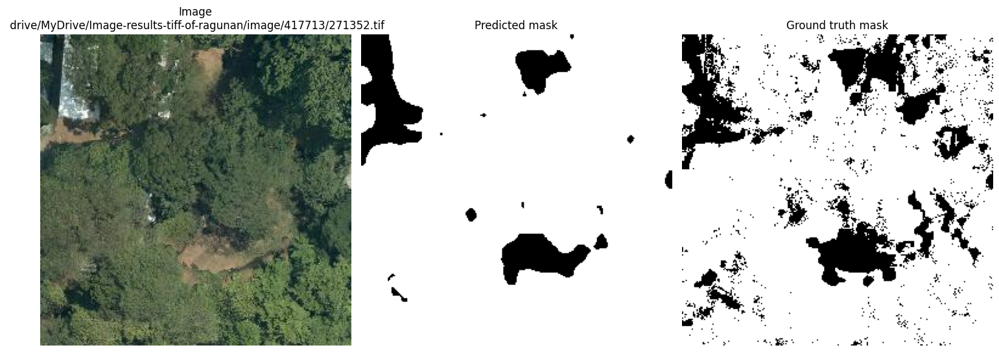

...

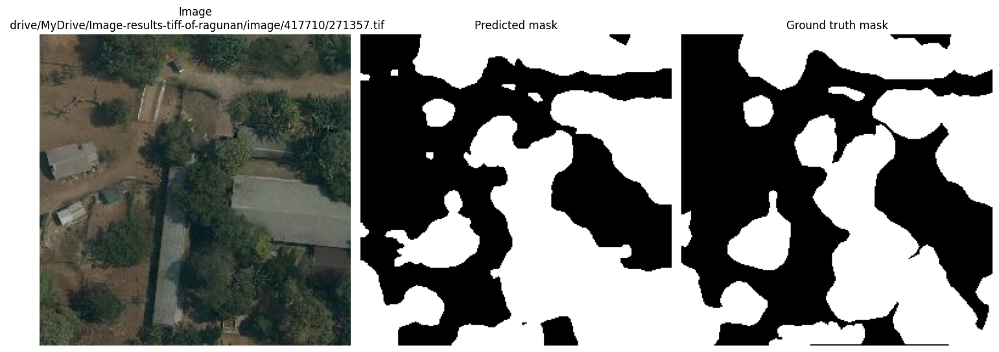

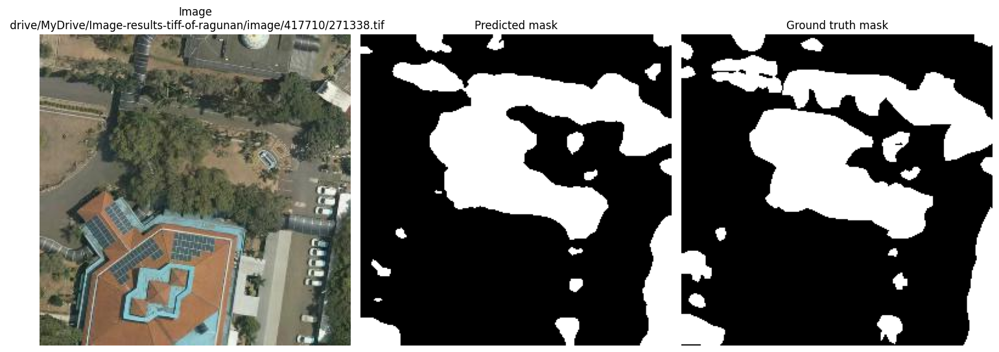

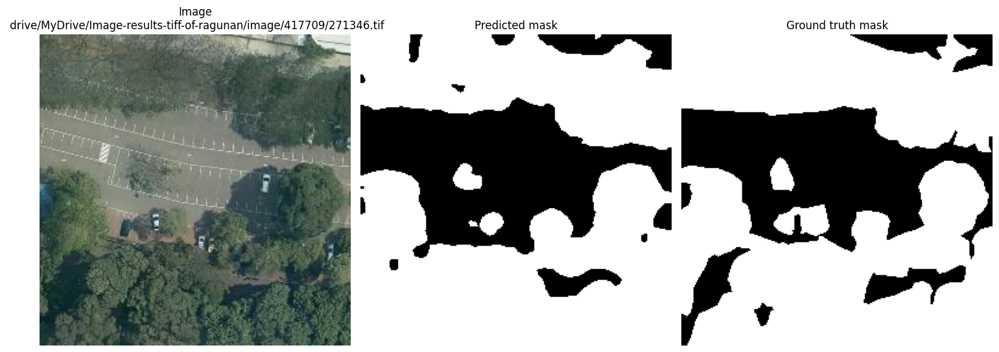

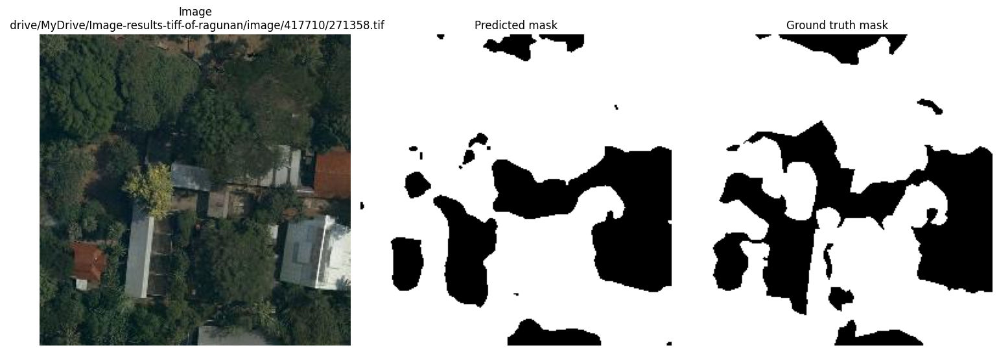

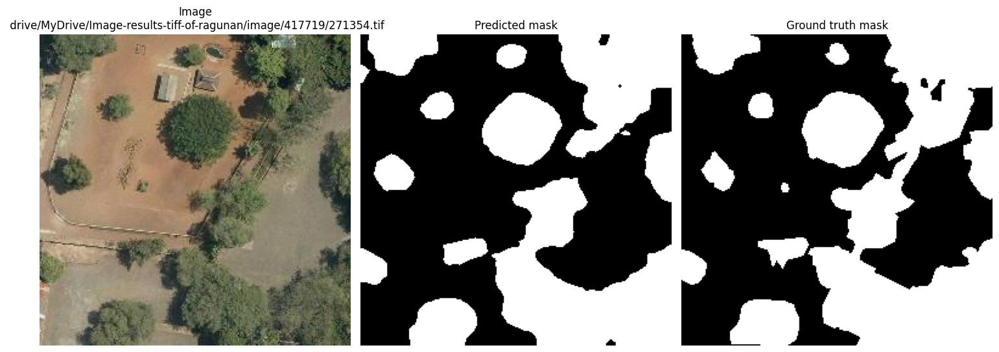

In [33]:
bin_masks = []
gt_masks = []
image_paths = []

with torch.no_grad():
    for images, masks, image_path, mask_path in test_loader:
        images = images.to(device)

        outputs = fine_tune_model(pixel_values = images)
        logits = outputs.logits

        upsampled_logits = F.interpolate(
            logits, size = masks.shape[-2:], mode = "bilinear", align_corners = False
        )

        probs = torch.softmax(upsampled_logits, dim = 1)
        preds = (probs[:, 1, :, :] > 0.5).cpu().numpy().astype(np.uint8) * 255

        for i in range(len(image_path)):
            img_path = image_path[i]
            mask_gt_path = mask_path[i]

            with rasterio.open(img_path) as src:
                img = src.read([1, 2, 3])
                img = np.transpose(img, (1, 2, 0))

            gt_mask = cv2.imread(mask_gt_path, cv2.IMREAD_GRAYSCALE)
            pred_mask = preds[i]

            bin_masks.append(pred_mask)
            gt_masks.append(gt_mask)
            image_paths.append(img_path)

            plt.figure(figsize = (15, 8))
            plt.subplot(1, 3, 1)
            plt.imshow(img)
            plt.title(f"Image\n {img_path}")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(pred_mask, cmap="gray")
            plt.title("Predicted mask")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(gt_mask, cmap="gray")
            plt.title("Ground truth mask")
            plt.axis("off")

            plt.tight_layout()
            plt.show()

In [34]:
iou_score = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    bin_mask = bin_masks[i]
    gt_mask = gt_masks[i]

    pixels = np.sum(bin_mask > 0)
    veg_area = pixels * (GSD_x * GSD_y)

    iou = calculate_iou(bin_mask, gt_mask)

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou}")
    print("=========================")

    iou_score.append(iou)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

print("===========================")
print(f"Average IoU score: {np.mean(iou_score)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 39985
Vegetation coverage area: 22504.75406930299
IoU score: 0.8219833615548848
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 48587
Vegetation coverage area: 3775.5951843308017
IoU score: 0.7221712030324938
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 21947
Vegetation coverage area: 12352.428099512135
IoU score: 0.580914700758806
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 42650
Vegetation coverage area: 24004.69578731456
IoU score: 0.8355529294122994
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 59486
Veg

In [37]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 22504.75406930299 m^2
Carbon density: 0.007123786698744795 ton/m^2
Estimated carbon stock: 160.31906769742343 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3775.5951843308017 m^2
Carbon density: 0.007123786698744795 ton/m^2
Estimated carbon stock: 26.896534753980667 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 12352.428099512135 m^2
Carbon density: 0.007123786698744795 ton/m^2
Estimated carbon stock: 87.996062992506 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 24004.69578731456 m^2
Carbon density: 0.007123786698744795 ton/m^2
Estimated carbon stock: 171.00433255708666 ton
Image drive/MyDrive/Image-results-tiff-of-ragunan/image/417713/271352.tif
Vegetation coverage area: 4622.533911027684 m^2
Carbon density: 0.00712